## Exploratory Data analysis

##### import libraries

In [179]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
#import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.util import ngrams
import regex as re

from wordcloud import WordCloud
from PIL import Image # used for opening image for masking wordcloud # you need to install Pillow package

import nltk
nltk.download('punkt') # sentance tokenizer
nltk.download('stopwords')
nltk.download('wordnet') # WordNet is a lexical database for the English language - used to find the lemma of a word

nltk.download('vader_lexicon') # Valence Aware Dictionary and sEntiment Reasoner
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\veera\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\veera\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\veera\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\veera\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [180]:
##load data
ps_df = pd.read_csv("A1_data_presidents.csv",encoding="utf-8",quotechar="'")
ps_df.head()

,Name,Political Party,Speech,Date,Start_year,End_year,Title
0,George Washington,Federalist,"Fellow citizens:\r For eight years, it has ...","January 15, 2009",1789,1797.0,"January 15, 2009: Farewell Address to the Nation"
1,George Washington,Federalist,THE PRESIDENT: Thank you. Tapper. We have b...,"January 12, 2009",1789,1797.0,"January 12, 2009: Final Press Conference"
2,George Washington,Federalist,"Good morning. For years, America's automake...","December 19, 2008",1789,1797.0,"December 19, 2008: Remarks on Plan to Assist A..."
3,George Washington,Federalist,Thank you very much. Please be seated. Than...,"November 13, 2008",1789,1797.0,"November 13, 2008: Speech on Financial Markets..."
4,George Washington,Federalist,"A short time ago, the House of Representati...","October 03, 2008",1789,1797.0,"October 3, 2008: Remarks on Emergency Economic..."


#### Q1 - Which president has the most vocabulary, as evident from their inaugural speeches, and which president has the least vocabulary? On average, do Democratic, Republican, or Other presidents have a higher vocabulary? 

In [181]:
## Created a Function to Tokenize and take count of vocabulary for each speech
def preprocess_and_count_vocabulary(text):
   sp_list=[]
   tokens =  nltk.word_tokenize(text)
   tokens = [word for word in tokens if word.isalpha()] # removing if word not an alphabet
   tokens = [word.lower() for word in tokens ] #lower case each word
   tokens = [word for word in tokens if len(word)>1] # select words where length greater than 1 since they dont effect the sentiment
   stop_words = stopwords.words('english') # def stop words 
   tokens = [word for word in tokens if word not in stop_words] # remove stop words
   lemmatizer = nltk.WordNetLemmatizer() # lemmatize each word
   tokens = [lemmatizer.lemmatize(word) for word in tokens]
   sp_list.append(tokens)
   count = len(set(tokens))
   return  sp_list,count

- Attaching to presidential speeches dataframe the tokens from function and vocabulary count of each speech of president

In [182]:
token_corpus=[]
vocab_count=[]
for row in ps_df['Speech']:
    x,y =preprocess_and_count_vocabulary(row)
    token_corpus.append(x)
    vocab_count.append(y)

ps_df['token_corpus']= token_corpus
ps_df['Vocabulary_count'] = vocab_count

In [183]:
ps_df.head()

,Name,Political Party,Speech,Date,Start_year,End_year,Title,token_corpus,Vocabulary_count
0,George Washington,Federalist,"Fellow citizens:\r For eight years, it has ...","January 15, 2009",1789,1797.0,"January 15, 2009: Farewell Address to the Nation","[[fellow, citizen, eight, year, honor, serve, ...",590
1,George Washington,Federalist,THE PRESIDENT: Thank you. Tapper. We have b...,"January 12, 2009",1789,1797.0,"January 12, 2009: Final Press Conference","[[president, thank, tapper, lot, together, loo...",1088
2,George Washington,Federalist,"Good morning. For years, America's automake...","December 19, 2008",1789,1797.0,"December 19, 2008: Remarks on Plan to Assist A...","[[good, morning, year, america, automaker, fac...",314
3,George Washington,Federalist,Thank you very much. Please be seated. Than...,"November 13, 2008",1789,1797.0,"November 13, 2008: Speech on Financial Markets...","[[thank, much, please, seated, thank, larry, t...",819
4,George Washington,Federalist,"A short time ago, the House of Representati...","October 03, 2008",1789,1797.0,"October 3, 2008: Remarks on Emergency Economic...","[[short, time, ago, house, representative, pas...",257


- Subsetting the Inagural speeches using regex 

In [184]:
import re

pattern = r'Inaugural'

# Create a boolean mask indicating which rows have the pattern matched in the 'title' column
mask = ps_df['Title'].str.contains(pattern, case=False, na=False)

# Use the boolean mask to filter the DataFrame and select the matching rows
matching_rows = ps_df[mask].sort_values(by='Vocabulary_count', ascending= False)

# Print the selected rows
Is_df = pd.DataFrame(matching_rows)
Is_df[:3]

,Name,Political Party,Speech,Date,Start_year,End_year,Title,token_corpus,Vocabulary_count
130,William Henry Harrison,Whig,Called from a retirement which I had supposed...,"March 04, 1841",1841,1841.0,"March 4, 1841: Inaugural Address","[[called, retirement, supposed, continue, resi...",1558
450,William Howard Taft,Republican,My Fellow-Citizens: Anyone who has taken the ...,"March 04, 1909",1909,1913.0,"March 4, 1909: Inaugural Address","[[anyone, taken, oath, taken, must, feel, heav...",1400
402,Benjamin Harrison,Republican,Fellow-Citizens: There is no constitutional o...,"March 04, 1889",1889,1893.0,"March 4, 1889: Inaugural Address","[[constitutional, legal, requirement, presiden...",1263


- Q1 answer : Highest and Lowest president vocabulary of Inagural speeches

In [185]:
highest_vocab_p = Is_df.loc[Is_df['Vocabulary_count'].idxmax()]
print(f'Highest Vocabulary President: {highest_vocab_p["Name"]} - Vocabulary Count: {highest_vocab_p["Vocabulary_count"]}')
lowest_vocab_p = Is_df.loc[Is_df['Vocabulary_count'].idxmin()]
print(f'Lowest Vocabulary President: {lowest_vocab_p["Name"]} - Vocabulary Count: {lowest_vocab_p["Vocabulary_count"]}')

Highest Vocabulary President: William Henry Harrison - Vocabulary Count: 1558
Lowest Vocabulary President: Franklin D. Roosevelt - Vocabulary Count: 183


- Q1 answer: Grouping based on party for all the speeches

In [186]:
party_vocabulary_sums = []

for party in ps_df['Political Party'].unique():
    vocabulary_sum = ps_df[ps_df['Political Party'] == party]['Vocabulary_count'].sum()
    party_vocabulary_sums.append((party, vocabulary_sum))

In [187]:
party_vocabulary_sums_df = pd.DataFrame(party_vocabulary_sums)
highest_vocab_party = party_vocabulary_sums_df.loc[party_vocabulary_sums_df[1].idxmax()]
print(f'Highest Vocabulary President: {highest_vocab_party[0]} - Vocabulary_count:{highest_vocab_party[1]}')
lowest_vocab_party = party_vocabulary_sums_df.loc[party_vocabulary_sums_df[1].idxmin()]
print(f'lowest Vocabulary President: {lowest_vocab_party[0]} - Vocabulary_count:{lowest_vocab_party[1]}')

Highest Vocabulary President: Republican - Vocabulary_count:368911
lowest Vocabulary President: Democratic (Union) - Vocabulary_count:19670


* summary: 
- William Henry Harrison Highest vocabulary and Franklin D. Roosevelt with Lowest.
- Democratic with Highest Vocabulary

### Q2 - Create a barplot of presidential vocabulary from the earliest president (Washington) to the latest (Biden) in chronological order. Color code this barplot as blue for Democrat, red for Republican, and gray for Others.

In [188]:
import matplotlib.pyplot as plt
s_df = ps_df

In [189]:
## sorting the presidential speeches dataframe chronologically 
sorted_df = s_df.sort_values(by='Start_year')

In [190]:
## Attaching color column to the speeches dataframe based on question
sorted_df['color'] = sorted_df['Political Party'].apply(lambda x: 'blue' if x == 'Democratic' else ('red' if x == 'Republican' else 'gray'))
sorted_df[:3]

,Name,Political Party,Speech,Date,Start_year,End_year,Title,token_corpus,Vocabulary_count,color
0,George Washington,Federalist,"Fellow citizens:\r For eight years, it has ...","January 15, 2009",1789,1797.0,"January 15, 2009: Farewell Address to the Nation","[[fellow, citizen, eight, year, honor, serve, ...",590,gray
22,George Washington,Federalist,Thank you all very much. Please be seated. ...,"November 06, 2003",1789,1797.0,"November 6, 2003: Remarks on Freedom in Iraq a...","[[thank, much, please, seated, thanks, warm, w...",941,gray
23,George Washington,Federalist,"My fellow citizens, at this hour, American ...","March 19, 2003",1789,1797.0,"March 20, 2003: Address on the Start of the Ir...","[[fellow, citizen, hour, american, coalition, ...",201,gray


- Barplot of Presidents Vocabulary arranged in choronological order

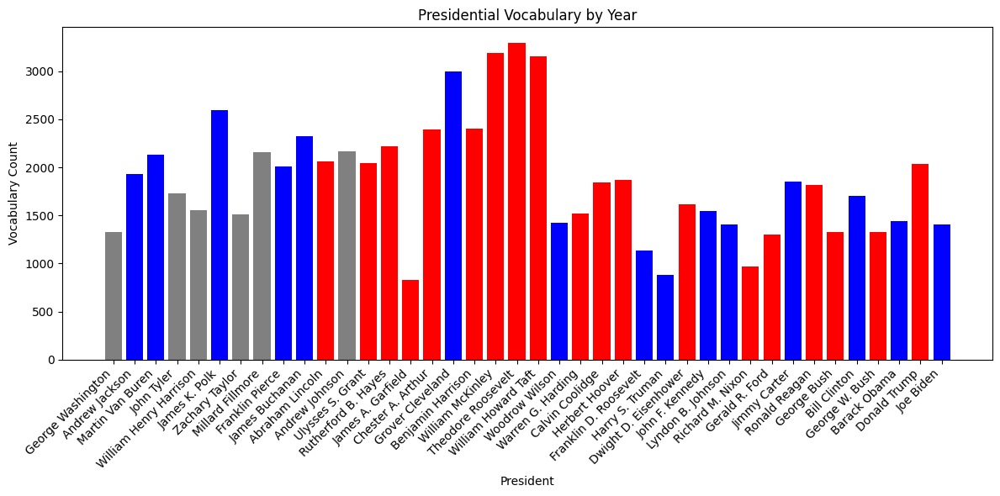

In [191]:
# Q2 Answer
plt.figure(figsize=(12, 6))
plt.bar(sorted_df['Name'], sorted_df['Vocabulary_count'], color=sorted_df['color'])
plt.xlabel('President')
plt.ylabel('Vocabulary Count')
plt.title('Presidential Vocabulary by Year')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()

# Show the plot
plt.show()

### Q3 What are the five most frequently used words (exclusive of stop words) used by each president? What are the five most frequently words used collectively by all Democratic presidents versus Republican presidents?

In [192]:
from collections import Counter

- A function to create token Frequencies of each speech

In [193]:
def calculate_word_freq(tokens_list):
    word_freq = Counter()
    for tokens in tokens_list:
        word_freq.update(tokens)
        sorted_word_freq = dict(sorted(word_freq.items(), key=lambda x: x[1], reverse=True))
    return dict(sorted_word_freq)

- Created a DataFrame combined_speeches which sums tokens of each president speeches grouped by name of each president and collected the top 5 words used by each president along with their frequencies

In [194]:
#Q3 answer
combined_speeches = ps_df.groupby('Name')['token_corpus'].sum().reset_index()
combined_speeches['WordFreq'] = combined_speeches['token_corpus'].apply(calculate_word_freq)
combined_speeches['Top 5 Words'] = combined_speeches['WordFreq'].apply(lambda x: ' ,'.join([f"{word}" for word, freq in list(x.items())[:5]]))
combined_speeches[['Name','Top 5 Words']]

,Name,Top 5 Words
0,Abraham Lincoln,"state ,slavery ,would ,slave ,one"
1,Andrew Jackson,"state ,government ,power ,upon ,country"
2,Andrew Johnson,"state ,united ,government ,law ,constitution"
3,Barack Obama,"applause ,people ,american ,year ,u"
4,Benjamin Harrison,"state ,government ,upon ,year ,united"
5,Bill Clinton,"people ,american ,year ,must ,america"
6,Calvin Coolidge,"government ,country ,made ,people ,would"
7,Chester A. Arthur,"state ,government ,year ,united ,may"
8,Donald Trump,"president ,people ,going ,know ,want"
9,Dwight D. Eisenhower,"nation ,must ,world ,people ,year"


- similarly for the political parties of Democratic and Republican created a word frequency dictionary from the function and collected top 5 used words

In [195]:
# Q3 answer
cs_df = pd.DataFrame(columns=['Party', 'Top 5 Words'])
for i in ['Democratic','Republican']:
    filtered_df = ps_df[ps_df['Political Party'] == i]
    
    # Combine the token_corpus lists for the filtered DataFrame
    combined_speeches = filtered_df.groupby('Political Party')['token_corpus'].sum().reset_index()
    combined_speeches['WordFreq'] = combined_speeches['token_corpus'].apply(calculate_word_freq)
    combined_speeches['Top 5 Words'] = combined_speeches['WordFreq'].apply(lambda x: ' ,'.join([f"{word}" for word, freq in list(x.items())[:5]]))
    cs_df = pd.concat([cs_df, pd.DataFrame({'Party': [i], 'Top 5 Words': combined_speeches['Top 5 Words']})], ignore_index=True)
cs_df

,Party,Top 5 Words
0,Democratic,"state ,people ,government ,year ,would"
1,Republican,"state ,government ,people ,year ,united"


### Q4 What are the key themes (e.g., freedom, liberty, country, etc.) used by each president in their inaugural speech?

- To know Key Theme of a speech , Assuming the key words of theme are the most spoken words of a speech, collected the top 10 words of each speech.
- From the combined speeches since we have word frequencies collecting the top 10 words and joining them using ', ' as a seperator.

In [196]:
Is_df[:3]

,Name,Political Party,Speech,Date,Start_year,End_year,Title,token_corpus,Vocabulary_count
130,William Henry Harrison,Whig,Called from a retirement which I had supposed...,"March 04, 1841",1841,1841.0,"March 4, 1841: Inaugural Address","[[called, retirement, supposed, continue, resi...",1558
450,William Howard Taft,Republican,My Fellow-Citizens: Anyone who has taken the ...,"March 04, 1909",1909,1913.0,"March 4, 1909: Inaugural Address","[[anyone, taken, oath, taken, must, feel, heav...",1400
402,Benjamin Harrison,Republican,Fellow-Citizens: There is no constitutional o...,"March 04, 1889",1889,1893.0,"March 4, 1889: Inaugural Address","[[constitutional, legal, requirement, presiden...",1263


In [197]:
In_cs = Is_df.groupby(['Name','Start_year'])['token_corpus'].sum().reset_index()
In_cs['WordFreq'] = In_cs['token_corpus'].apply(calculate_word_freq)
In_cs['Top 10 Words'] = combined_speeches['WordFreq'].apply(lambda x: ' ,'.join([f"{word}" for word, freq in list(x.items())[:10]]))
In_cs

,Name,Start_year,token_corpus,WordFreq,Top 10 Words
0,Abraham Lincoln,1861,"[[fellow, citizen, united, state, compliance, ...","{'state': 27, 'union': 24, 'constitution': 22,...","state ,government ,people ,year ,united ,ameri..."
1,Barack Obama,2009,"[[stand, today, humbled, task, u, grateful, tr...","{'u': 44, 'applause': 25, 'must': 24, 'nation'...",NaN
2,Benjamin Harrison,1889,"[[constitutional, legal, requirement, presiden...","{'people': 26, 'law': 23, 'state': 22, 'upon':...",NaN
3,Bill Clinton,1993,"[[fellow, citizen, last, presidential, inaugur...","{'u': 40, 'new': 38, 'world': 35, 'america': 3...",NaN
4,Calvin Coolidge,1923,"[[countryman, one, contemplate, current, condi...","{'country': 16, 'great': 13, 'must': 13, 'nati...",NaN
5,Donald Trump,2017,"[[chief, justice, robert, president, carter, p...","{'america': 18, 'american': 16, 'country': 12,...",NaN
6,Dwight D. Eisenhower,1953,"[[friend, begin, expression, thought, deem, ap...","{'people': 31, 'world': 31, 'nation': 28, 'fre...",NaN
7,Franklin D. Roosevelt,1933,"[[president, hoover, chief, justice, friend, d...","{'nation': 32, 'people': 30, 'government': 23,...",NaN
8,Franklin Pierce,1853,"[[countryman, relief, feel, heart, know, perso...","{'upon': 20, 'right': 15, 'power': 11, 'nation...",NaN
9,George Bush,1989,"[[vice, president, cheney, chief, justice, pre...","{'freedom': 32, 'america': 31, 'nation': 25, '...",NaN


- wordcloud of Inaugral speeches 

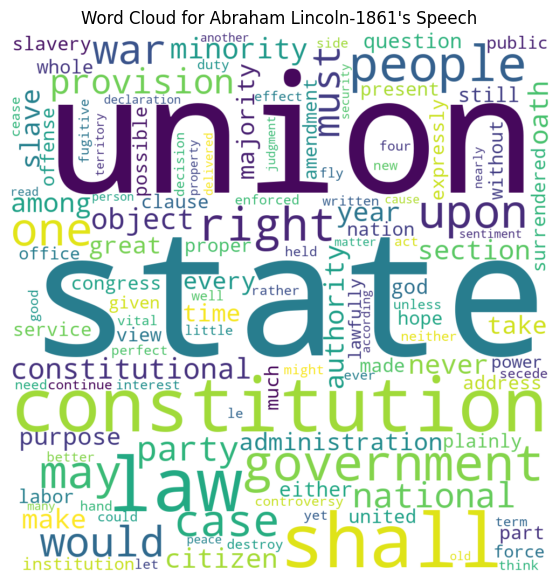

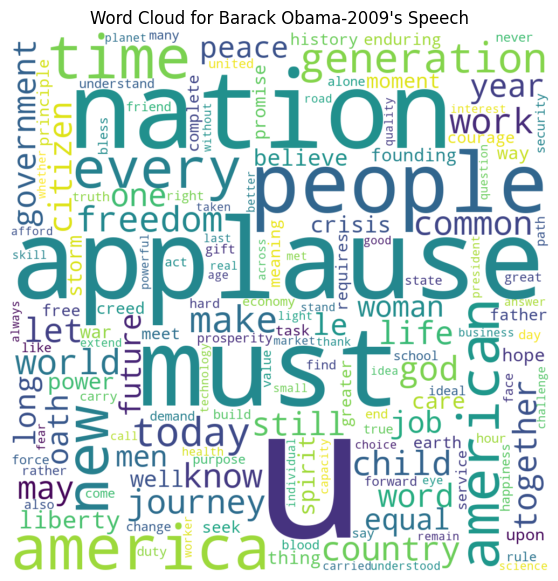

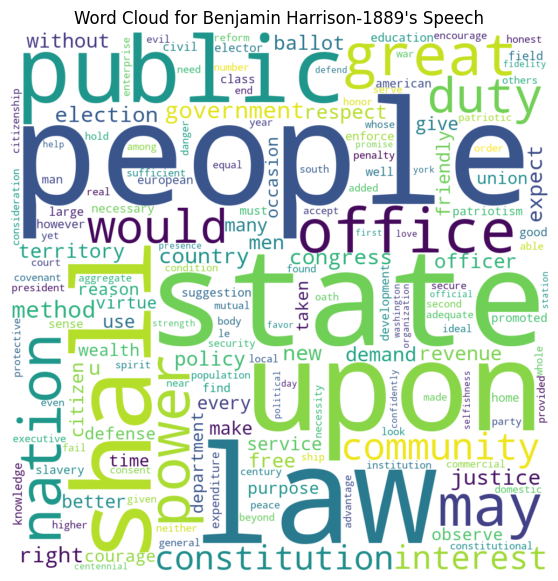

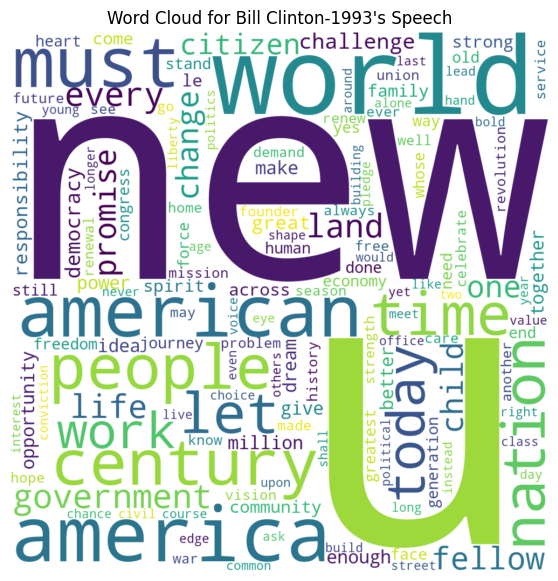

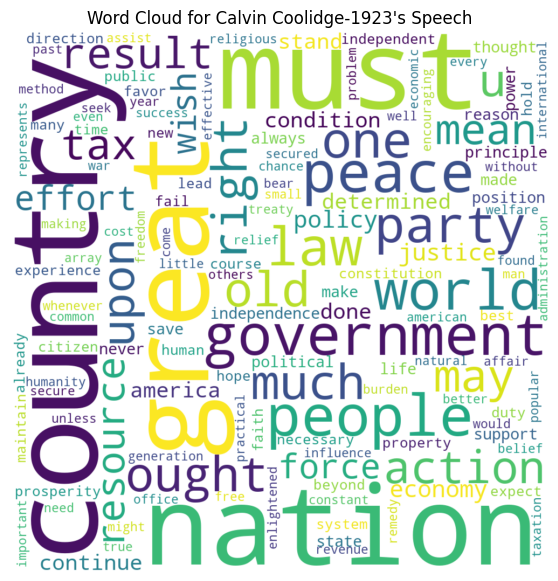

...

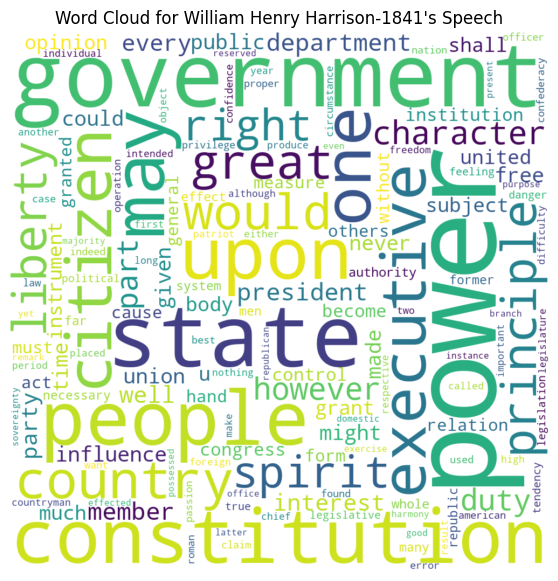

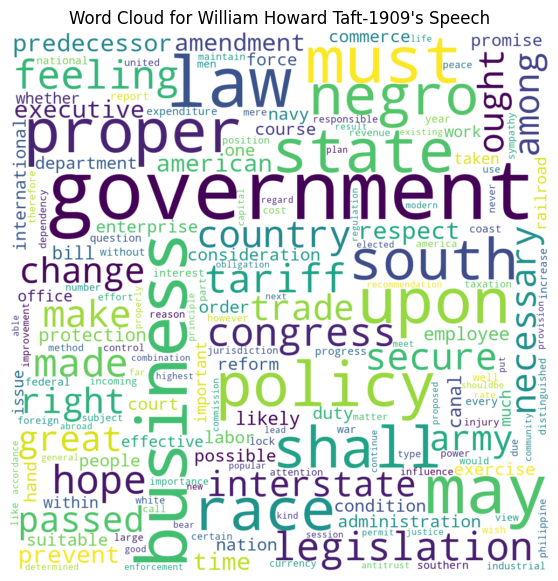

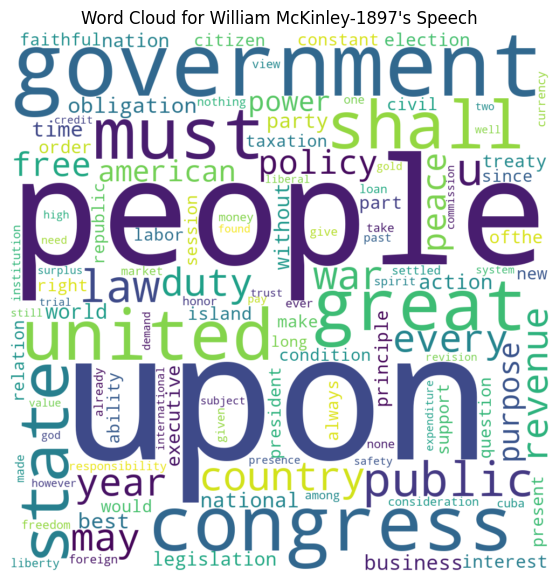

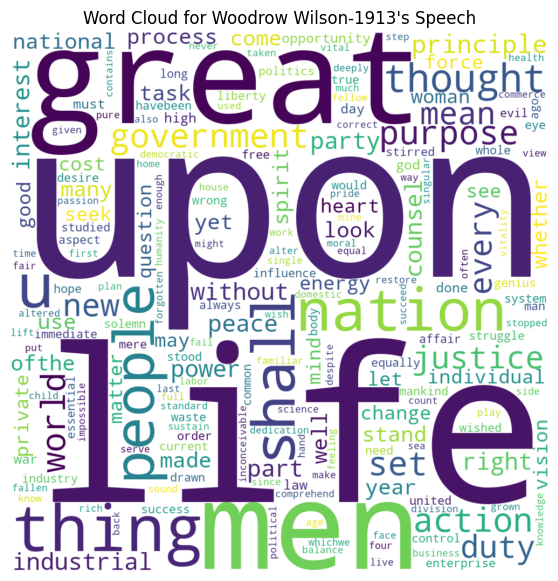

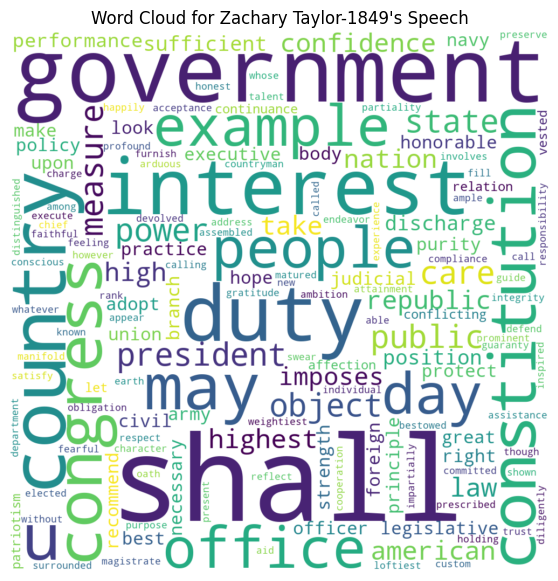

In [198]:
wordcloud = WordCloud(
    width=1000, 
    height=1000,
    background_color='white', 
    collocations='FALSE', 
    min_font_size=16
)
for index, row in In_cs.iterrows():
    combined_word_freq = row['WordFreq']
    
    # Generate the word cloud from the combined word frequency data
    wordcloud.generate_from_frequencies(combined_word_freq)
    
    # Create a plot for each row
    plt.figure(figsize=(7, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(f"Word Cloud for {row['Name']}-{row['Start_year']}'s Speech")
    plt.show()

### Q5 Compute a sentiment (positive/negative) for each presidential speech, and draw a barplot of the sentiment of all presidential speeches in chronological order. Again, color code the speeches as blue for Democrat, red for Republican, and gray for Other. Which of these groups have higher mean sentiment score? Who are the top three presidents with the highest positive sentiment in each group?

In [199]:
## sorted data frame of presidential speeches chronologically 
sorted_df[:5]

,Name,Political Party,Speech,Date,Start_year,End_year,Title,token_corpus,Vocabulary_count,color
0,George Washington,Federalist,"Fellow citizens:\r For eight years, it has ...","January 15, 2009",1789,1797.0,"January 15, 2009: Farewell Address to the Nation","[[fellow, citizen, eight, year, honor, serve, ...",590,gray
22,George Washington,Federalist,Thank you all very much. Please be seated. ...,"November 06, 2003",1789,1797.0,"November 6, 2003: Remarks on Freedom in Iraq a...","[[thank, much, please, seated, thanks, warm, w...",941,gray
23,George Washington,Federalist,"My fellow citizens, at this hour, American ...","March 19, 2003",1789,1797.0,"March 20, 2003: Address on the Start of the Ir...","[[fellow, citizen, hour, american, coalition, ...",201,gray
24,George Washington,Federalist,"My fellow citizens, events in Iraq have now...","March 17, 2003",1789,1797.0,"March 17, 2003: Address to the Nation on Iraq","[[fellow, citizen, event, iraq, reached, final...",506,gray
25,George Washington,Federalist,"Mr. Speaker, Vice President Cheney, members...","January 28, 2003",1789,1797.0,"January 28, 2003: State of the Union Address","[[speaker, vice, president, cheney, member, co...",1276,gray


In [200]:
## downloading vader for sentimental analysis of speech
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\veera\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


- Calculating polarity scores of each speech and appending it to the speeches data frame as Sentiment

In [201]:
s_df['Sentiment'] = s_df['Speech'].apply(lambda x: sia.polarity_scores(x)['compound'])

- Polarity calculation based on sentiment if the sentiment is greater than 0.2 as positive and less then -0.2 as Negative and all others as Nuetrals.

In [202]:
s_df['Polarity'] = s_df['Sentiment'].apply(lambda x: 'Positive' if x>=0.2 else ('Negative' if x<= -0.2 else 'Nuetral'))

- Creating a bar plot barplot of the sentiment of all presidential speeches in chronological order and color code

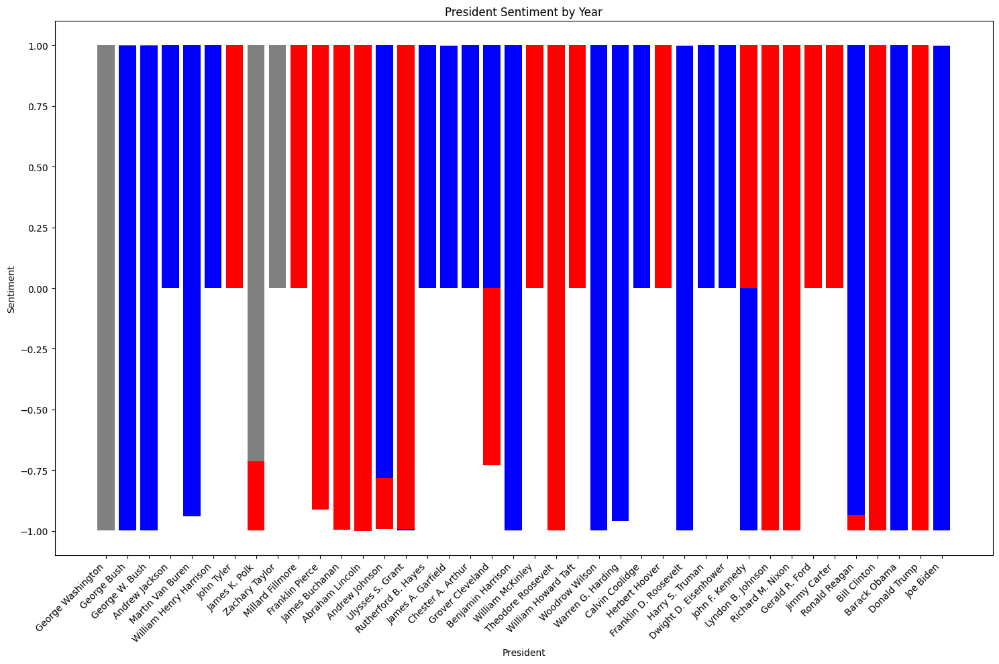

In [203]:

# Create a barplot
plt.figure(figsize=(15, 10))
plt.bar(s_df['Name'], s_df['Sentiment'], color=sorted_df['color'])
plt.xlabel('President')
plt.ylabel('Sentiment')
plt.title('President Sentiment by Year')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()

# Show the plot
plt.show()

- mean sentiment grouped by the Political Party

In [204]:
ms_df = pd.DataFrame(columns=['Party','Sentiment'])
for party in s_df['Political Party'].unique():
    pms_ = s_df[s_df['Political Party'] == party]
    sms_ = pms_['Sentiment'].mean()
    ms_df = pd.concat([ms_df, pd.DataFrame({'Party': [party], 'Sentiment': [sms_]})], ignore_index=True)
ms_df


,Party,Sentiment
0,Federalist,0.640236
1,Republican,0.835140
2,Democratic,0.880796
3,Whig,0.997620
4,Democratic (Union),0.647723


In [205]:
exclude_parties = ['Democratic', 'Republican']

# Filter the DataFrame to exclude specified parties
filtered_df = ms_df[~ms_df['Party'].isin(exclude_parties)]

# Calculate the mean sentiment for the filtered DataFrame
mean_sentiment = filtered_df['Sentiment'].mean()
for party in exclude_parties:
    p_df = ms_df[ms_df['Party'] == party]
    
    # Print the sentiment values for the current party
    print(f'{party}:',p_df['Sentiment'])
print(f'other: {mean_sentiment}')

Democratic: 2    0.880796
Name: Sentiment, dtype: float64
Republican: 1    0.83514
Name: Sentiment, dtype: float64
other: 0.7618594926936862


- Summary:
- Other parties has the most positive sentiment speeches of all presidents.
- In Democratic vs Republican, Democratic has the most positive sentimental Speeches

In [206]:
positive_sentiment_df = s_df[s_df['Sentiment'] > 0]

# Group the filtered DataFrame by 'Political Party'
positive_sentiment_df[:5]


,Name,Political Party,Speech,Date,Start_year,End_year,Title,token_corpus,Vocabulary_count,Sentiment,Polarity
0,George Washington,Federalist,"Fellow citizens:\r For eight years, it has ...","January 15, 2009",1789,1797.0,"January 15, 2009: Farewell Address to the Nation","[[fellow, citizen, eight, year, honor, serve, ...",590,0.9999,Positive
1,George Washington,Federalist,THE PRESIDENT: Thank you. Tapper. We have b...,"January 12, 2009",1789,1797.0,"January 12, 2009: Final Press Conference","[[president, thank, tapper, lot, together, loo...",1088,1.0000,Positive
2,George Washington,Federalist,"Good morning. For years, America's automake...","December 19, 2008",1789,1797.0,"December 19, 2008: Remarks on Plan to Assist A...","[[good, morning, year, america, automaker, fac...",314,0.9837,Positive
3,George Washington,Federalist,Thank you very much. Please be seated. Than...,"November 13, 2008",1789,1797.0,"November 13, 2008: Speech on Financial Markets...","[[thank, much, please, seated, thank, larry, t...",819,0.9999,Positive
4,George Washington,Federalist,"A short time ago, the House of Representati...","October 03, 2008",1789,1797.0,"October 3, 2008: Remarks on Emergency Economic...","[[short, time, ago, house, representative, pas...",257,0.9972,Positive


- From Postive_sentiment_speeches sorted presidents based on sentiment speeches on groups for each party collected top 3 presidents

In [207]:
g_p = pd.DataFrame(columns=['Party', 'Presidents'])
for party in positive_sentiment_df['Political Party'].unique():
    pty_df = positive_sentiment_df[positive_sentiment_df['Political Party'] == party]
    sod_df = pty_df.sort_values(by='Sentiment',ascending=False)
    g_p = pd.concat([g_p, pd.DataFrame({'Party': [party], 'Presidents': [', '.join(sod_df['Name'][:3])]})], ignore_index=True)
g_p


,Party,Presidents
0,Federalist,"George Washington, George Washington, George W..."
1,Republican,"Ulysses S. Grant, Rutherford B. Hayes, Dwight ..."
2,Democratic,"Andrew Jackson, Bill Clinton, Bill Clinton"
3,Whig,"William Henry Harrison, John Tyler, Millard Fi..."
4,Democratic (Union),"Andrew Johnson, Andrew Johnson, Andrew Johnson"
